# Portfolio - CheckPoint 1 (Time Series Analysis)

Team: Moises' Team

Team members:

* Luis Arturo Michel Perez
* Oscar Martinez Estevez
* Moises Jesus Carrillo Alonso
* Braulio Jesus Perez Tamayo
* Gerardo Hernandez Widman
* Mario David Hernandez Pantoja

## Setup Configuration

In [ ]:
import plotly.io as pio
pio.renderers.default = 'notebook'  # o 'notebook_connected'

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import plotly.graph_objects as go

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


### Loading and verifing data

In [ ]:

# Opciones display
pd.options.display.max_columns = 200
sns.set(style="whitegrid", font_scale=1.0)

# === Rutas ===
DATA_DIR = Path("analyst")

trends_fp = DATA_DIR / "trends_enriched.csv"
geojson_fp = DATA_DIR / "geo_countries.geojson"
country_agg_fp = DATA_DIR / "country_aggregated.csv"
integrated_fp = DATA_DIR / "integrated_data.csv"

In [ ]:
df_trends = pd.read_csv(trends_fp, parse_dates=['date'])
df_trends['date'] = pd.to_datetime(df_trends['date']).dt.date
df_trends.head()


,date,country,keyword,interest,country_code,iso3,name,region,lon,lat
0,2020-10-11,US,Bitcoin,12,US,USA,United States,Americas,-77.0369,38.9072
1,2020-10-18,US,Bitcoin,18,US,USA,United States,Americas,-77.0369,38.9072
2,2020-10-25,US,Bitcoin,18,US,USA,United States,Americas,-77.0369,38.9072
3,2020-11-01,US,Bitcoin,19,US,USA,United States,Americas,-77.0369,38.9072
4,2020-11-08,US,Bitcoin,21,US,USA,United States,Americas,-77.0369,38.9072


In [ ]:
# Summaries
print("Filas:", len(df_trends))
print(df_trends[['country','iso3','name','region']].drop_duplicates().shape, "países x meta")
print("Nulls por columna:\n", df_trends.isna().sum())

# Rango de fechas
print("Fecha min/max:", df_trends['date'].min(), df_trends['date'].max())

# Valores interest
print("Interest range:", df_trends['interest'].min(), df_trends['interest'].max())


Filas: 13100
(10, 4) países x meta
Nulls por columna:
 date            0
country         0
keyword         0
interest        0
country_code    0
iso3            0
name            0
region          0
lon             0
lat             0
dtype: int64
Fecha min/max: 2020-10-11 2025-10-12
Interest range: 0 100


# Part 1: Time Series Analysis

In [1]:
# 1) Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf

In [2]:
plt.rcParams['figure.figsize'] = (12,5)

In [4]:
data = pd.read_csv("./analyst/prices_with_metrics.csv")

In [ ]:
data.head(6)

,Date,crypto,Open,High,Low,Close,Volume,returns,log_returns,volatility_7d,volatility_30d,returns_squared,price_normalized
0,2020-10-12,BNB,28.549908,31.082113,28.491446,30.714682,718406691,NaN,NaN,NaN,NaN,NaN,0.003006
1,2020-10-13,BNB,30.670006,31.765100,30.269403,30.706745,600050050,-0.000258,-0.000258,NaN,NaN,6.676726e-08,0.003000
2,2020-10-14,BNB,30.738811,31.297539,30.461908,30.912119,460297911,0.006688,0.006666,0.004912,0.004912,4.473242e-05,0.003160
3,2020-10-15,BNB,30.889919,31.569292,30.500120,31.295864,504135680,0.012414,0.012338,0.006346,0.006346,1.541091e-04,0.003459
4,2020-10-16,BNB,31.314039,31.917166,29.666964,29.994900,546849696,-0.041570,-0.042459,0.024480,0.024480,1.728052e-03,0.002445
5,2020-10-17,BNB,30.043756,30.555607,29.719992,30.248236,377026508,0.008446,0.008411,0.022122,0.022122,7.133437e-05,0.002642


##1.1 random walk test

🔍 RANDOM WALK TEST - Augmented Dickey-Fuller (ADF)

📊 ADF Test for PRICES (Close):
   ADF Statistic: -2.805176
   p-value: 0.057538
   Critical Values:
      1%: -3.431
      5%: -2.862
      10%: -2.567
   ✅ CONCLUSION: Fail to reject null → Prices follow a RANDOM WALK (non-stationary)

📊 ADF Test for RETURNS:
   ADF Statistic: -13.376397
   p-value: 0.000000
   Critical Values:
      1%: -3.431
      5%: -2.862
      10%: -2.567
   ✅ CONCLUSION: Reject null → Returns are STATIONARY (as expected)


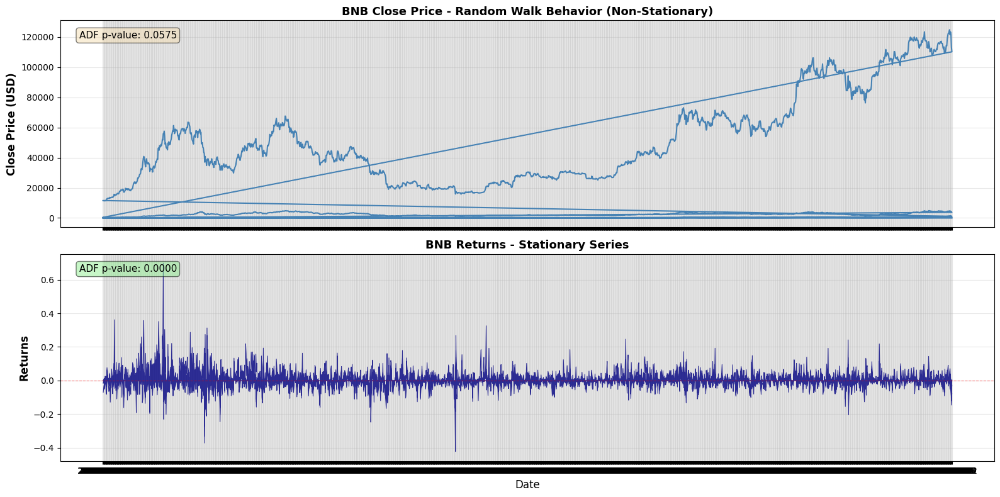


💡 INTERPRETATION:
   • High p-value (>0.05) for prices → Random Walk (non-stationary)
   • Low p-value (<0.05) for returns → Stationary process


In [5]:
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# ===== RANDOM WALK TEST =====
print("=" * 70)
print("🔍 RANDOM WALK TEST - Augmented Dickey-Fuller (ADF)")
print("=" * 70)

# Test ADF para precios (Close)
adf_prices = adfuller(data['Close'].dropna(), autolag='AIC')

print("\n📊 ADF Test for PRICES (Close):")
print(f"   ADF Statistic: {adf_prices[0]:.6f}")
print(f"   p-value: {adf_prices[1]:.6f}")
print(f"   Critical Values:")
for key, value in adf_prices[4].items():
    print(f"      {key}: {value:.3f}")

if adf_prices[1] > 0.05:
    print("   ✅ CONCLUSION: Fail to reject null → Prices follow a RANDOM WALK (non-stationary)")
else:
    print("   ❌ CONCLUSION: Reject null → Prices are stationary (NOT a random walk)")

# Test ADF para retornos
adf_returns = adfuller(data['returns'].dropna(), autolag='AIC')

print("\n📊 ADF Test for RETURNS:")
print(f"   ADF Statistic: {adf_returns[0]:.6f}")
print(f"   p-value: {adf_returns[1]:.6f}")
print(f"   Critical Values:")
for key, value in adf_returns[4].items():
    print(f"      {key}: {value:.3f}")

if adf_returns[1] < 0.05:
    print("   ✅ CONCLUSION: Reject null → Returns are STATIONARY (as expected)")
else:
    print("   ⚠️  CONCLUSION: Fail to reject null → Returns may be non-stationary")

# Visualización: Precios vs Returns
fig, axes = plt.subplots(2, 1, figsize=(16, 8), sharex=True)

# Panel 1: Precios (Random Walk)
axes[0].plot(data['Date'], data['Close'], color='steelblue', linewidth=1.5)
axes[0].set_ylabel('Close Price (USD)', fontsize=12, fontweight='bold')
axes[0].set_title('BNB Close Price - Random Walk Behavior (Non-Stationary)',
                  fontsize=13, fontweight='bold')
axes[0].grid(alpha=0.3)
axes[0].text(0.02, 0.95, f'ADF p-value: {adf_prices[1]:.4f}',
             transform=axes[0].transAxes, fontsize=11,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Panel 2: Returns (Stationary)
axes[1].plot(data['Date'], data['returns'], color='navy', linewidth=0.8, alpha=0.8)
axes[1].axhline(0, color='red', linestyle='--', linewidth=0.8, alpha=0.5)
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('Returns', fontsize=12, fontweight='bold')
axes[1].set_title('BNB Returns - Stationary Series', fontsize=13, fontweight='bold')
axes[1].grid(alpha=0.3)
axes[1].text(0.02, 0.95, f'ADF p-value: {adf_returns[1]:.4f}',
             transform=axes[1].transAxes, fontsize=11,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n" + "=" * 70)
print("💡 INTERPRETATION:")
print("   • High p-value (>0.05) for prices → Random Walk (non-stationary)")
print("   • Low p-value (<0.05) for returns → Stationary process")
print("=" * 70)

##1.2 ACF analysis


📊 AUTOCORRELATION FUNCTION (ACF) ANALYSIS


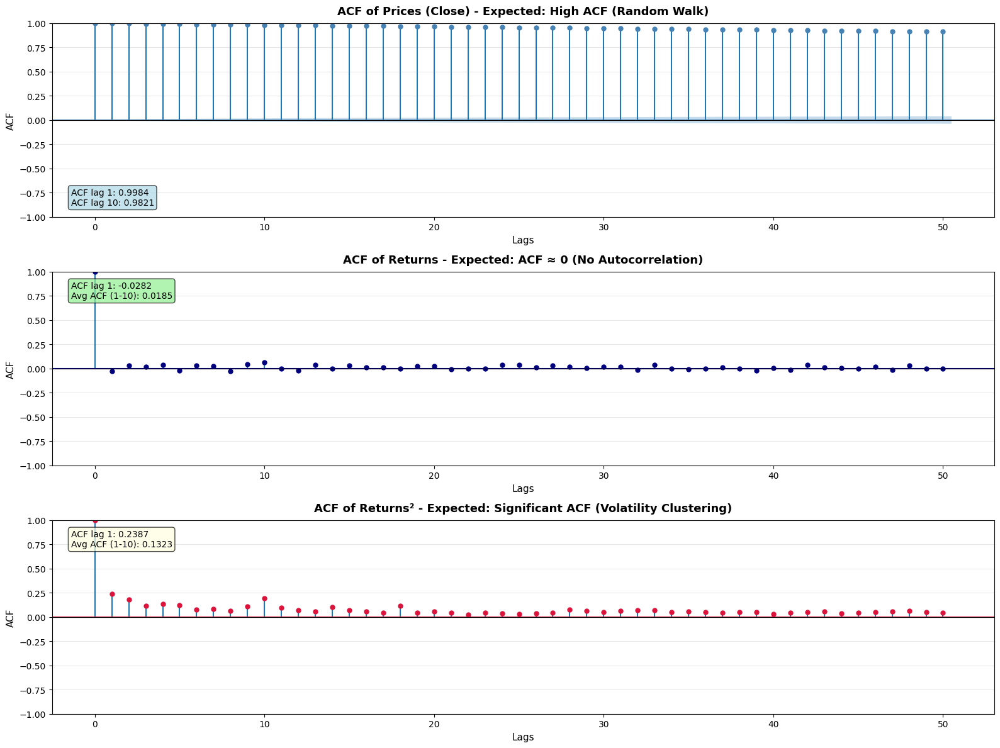


📈 ACF SUMMARY:
   Prices (lag 1):      0.9984 → Very high (Random Walk)
   Returns (avg 1-10):  0.0185 → Near zero (No autocorrelation)
   Returns² (avg 1-10): 0.1323 → Significant (Volatility clustering detected)


In [6]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
import numpy as np

# ===== ACF ANALYSIS =====
print("=" * 70)
print("📊 AUTOCORRELATION FUNCTION (ACF) ANALYSIS")
print("=" * 70)

# Recalcular returns² sin suavizar
returns_squared_raw = data['returns'].dropna() ** 2

# Crear figura con 3 subplots
fig, axes = plt.subplots(3, 1, figsize=(16, 12))

# ===== ACF 1: PRECIOS =====
plot_acf(data['Close'].dropna(), lags=50, ax=axes[0], title='', color='steelblue', alpha=0.7)
axes[0].set_title('ACF of Prices (Close) - Expected: High ACF (Random Walk)',
                  fontsize=13, fontweight='bold', pad=10)
axes[0].set_xlabel('Lags', fontsize=11)
axes[0].set_ylabel('ACF', fontsize=11)
axes[0].grid(alpha=0.3, axis='y')
axes[0].axhline(y=0, color='black', linestyle='-', linewidth=0.8)

# Estadísticas de ACF para precios
acf_prices_values = [data['Close'].dropna().autocorr(lag=i) for i in range(1, 11)]
axes[0].text(0.02, 0.05, f'ACF lag 1: {acf_prices_values[0]:.4f}\nACF lag 10: {acf_prices_values[9]:.4f}',
             transform=axes[0].transAxes, fontsize=10,
             verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))

# ===== ACF 2: RETORNOS =====
plot_acf(data['returns'].dropna(), lags=50, ax=axes[1], title='', color='navy', alpha=0.7)
axes[1].set_title('ACF of Returns - Expected: ACF ≈ 0 (No Autocorrelation)',
                  fontsize=13, fontweight='bold', pad=10)
axes[1].set_xlabel('Lags', fontsize=11)
axes[1].set_ylabel('ACF', fontsize=11)
axes[1].grid(alpha=0.3, axis='y')
axes[1].axhline(y=0, color='black', linestyle='-', linewidth=0.8)

# Estadísticas de ACF para retornos
acf_returns_values = [data['returns'].dropna().autocorr(lag=i) for i in range(1, 11)]
axes[1].text(0.02, 0.95, f'ACF lag 1: {acf_returns_values[0]:.4f}\nAvg ACF (1-10): {np.mean(acf_returns_values):.4f}',
             transform=axes[1].transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))

# ===== ACF 3: RETORNOS² (RAW) =====
plot_acf(returns_squared_raw, lags=50, ax=axes[2], title='', color='crimson', alpha=0.7)
axes[2].set_title('ACF of Returns² - Expected: Significant ACF (Volatility Clustering)',
                  fontsize=13, fontweight='bold', pad=10)
axes[2].set_xlabel('Lags', fontsize=11)
axes[2].set_ylabel('ACF', fontsize=11)
axes[2].grid(alpha=0.3, axis='y')
axes[2].axhline(y=0, color='black', linestyle='-', linewidth=0.8)

# Estadísticas de ACF para returns²
acf_returns_sq_values = [returns_squared_raw.autocorr(lag=i) for i in range(1, 11)]
axes[2].text(0.02, 0.95, f'ACF lag 1: {acf_returns_sq_values[0]:.4f}\nAvg ACF (1-10): {np.mean(acf_returns_sq_values):.4f}',
             transform=axes[2].transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.7))

plt.tight_layout()
plt.show()

# Resumen de resultados
print("\n📈 ACF SUMMARY:")
print(f"   Prices (lag 1):      {acf_prices_values[0]:.4f} → Very high (Random Walk)")
print(f"   Returns (avg 1-10):  {np.mean(acf_returns_values):.4f} → Near zero (No autocorrelation)")
print(f"   Returns² (avg 1-10): {np.mean(acf_returns_sq_values):.4f} → ", end="")

if np.mean(acf_returns_sq_values) > 0.05:
    print("Significant (Volatility clustering detected)")
else:
    print("Low (Weak clustering)")

print("=" * 70)

##1.3 Volatility


📊 MULTI-CRYPTO VOLATILITY, INTEREST & CORRELATION ANALYSIS

🔎 ANALYSIS FOR BNB


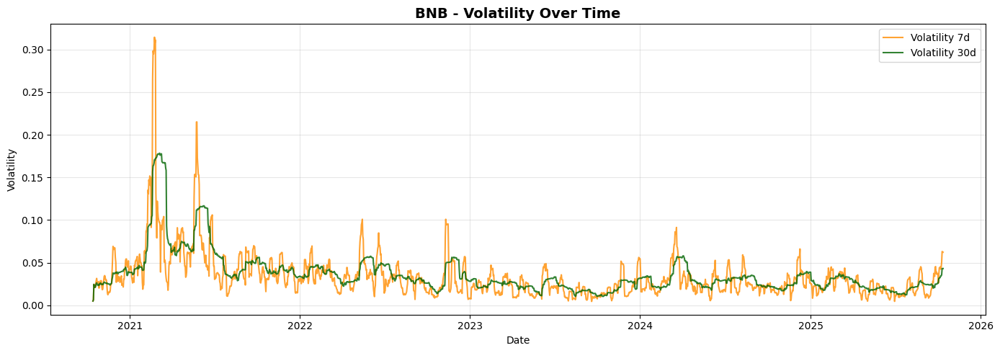

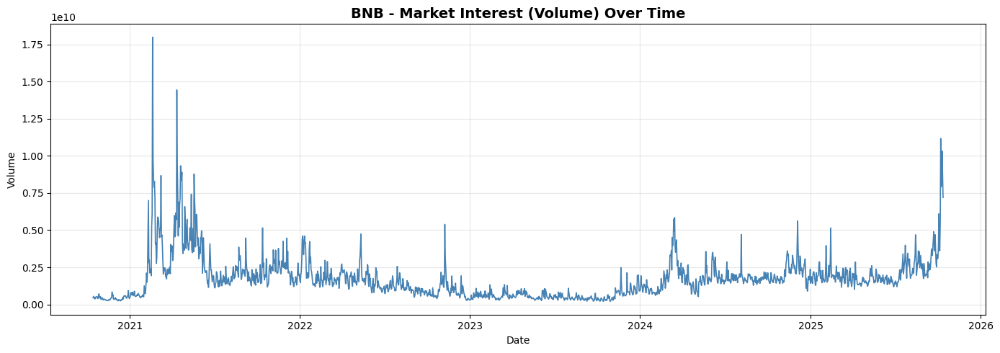

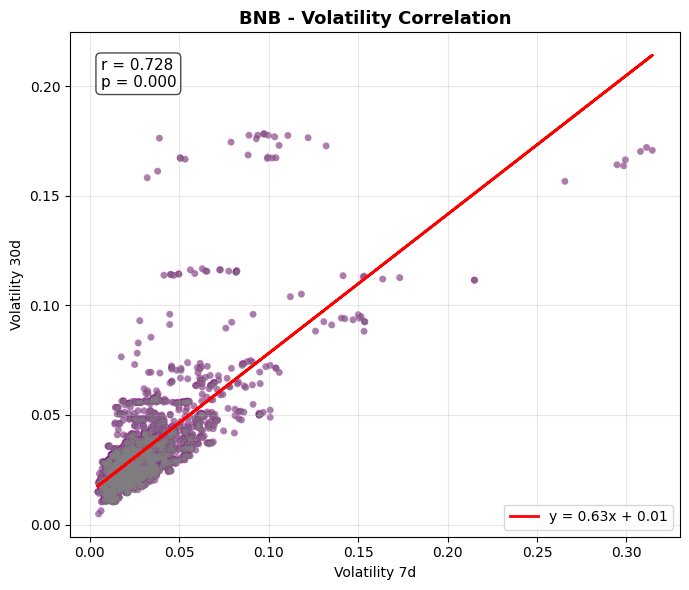

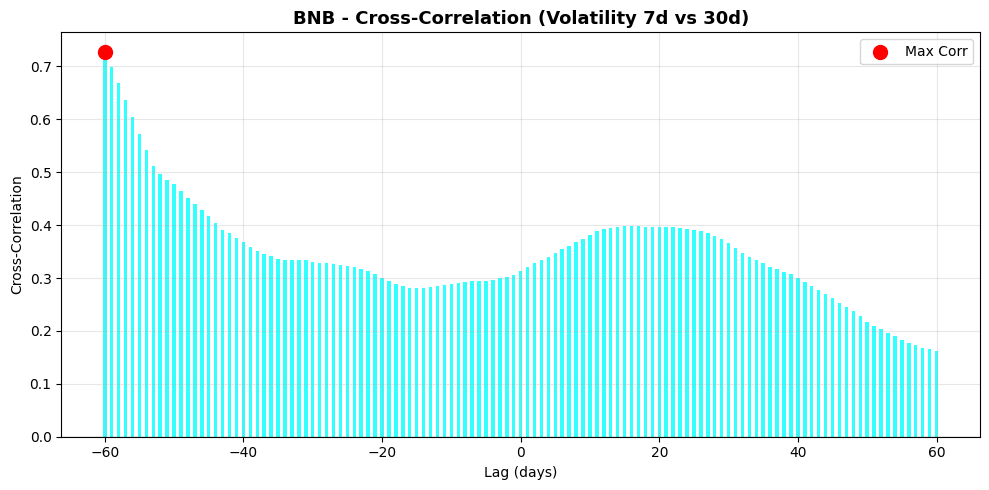


🔬 LJUNG-BOX TEST FOR VOLATILITY CLUSTERING:
       lb_stat     lb_pvalue
1    71.700320  2.504919e-17
2   133.584253  9.829876e-30
3   138.422112  8.273082e-30
4   149.825208  2.219133e-31
5   158.350983  2.223168e-32
6   159.198818  8.752183e-32
7   163.475231  5.951211e-32
8   170.045386  1.261766e-32
9   192.769104  1.083913e-36
10  337.104414  2.166709e-66

📊 Significant lags (p < 0.05): 20/20

💡 VOLATILITY CLUSTERING CONCLUSION:
   ✅ STRONG evidence of volatility clustering

📈 VOLATILITY & RETURNS STATISTICS:
   Mean volatility (7d):  0.033453
   Std volatility (7d):   0.028271
   Mean volatility (30d): 0.035903
   Std volatility (30d):  0.024620
   Mean returns:          0.002899
   Std returns:           0.044181
   Mean volume:           1723695010.89

🔎 ANALYSIS FOR Bitcoin


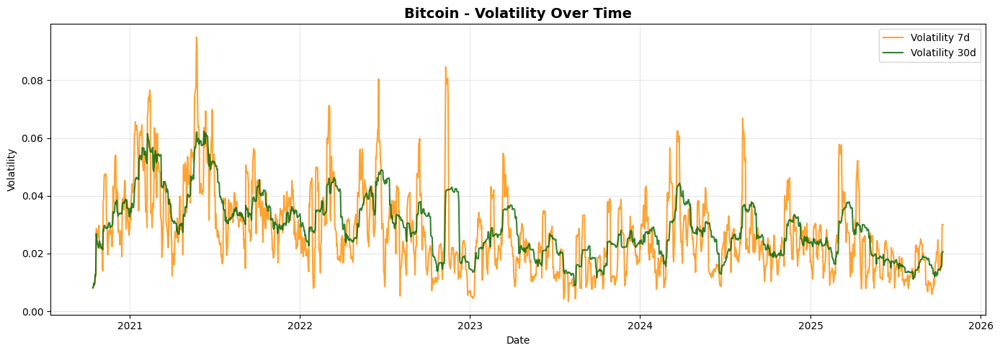

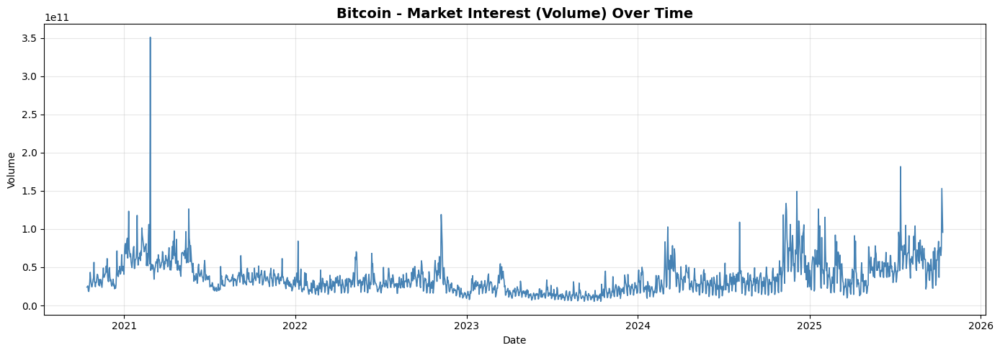

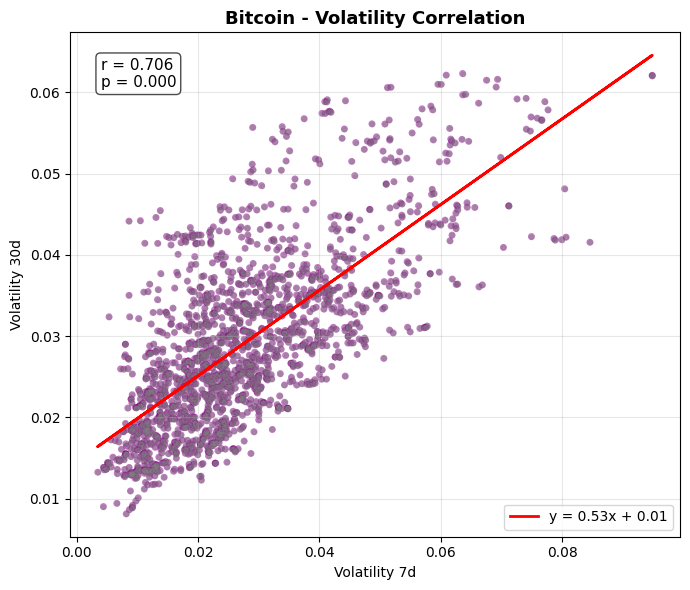

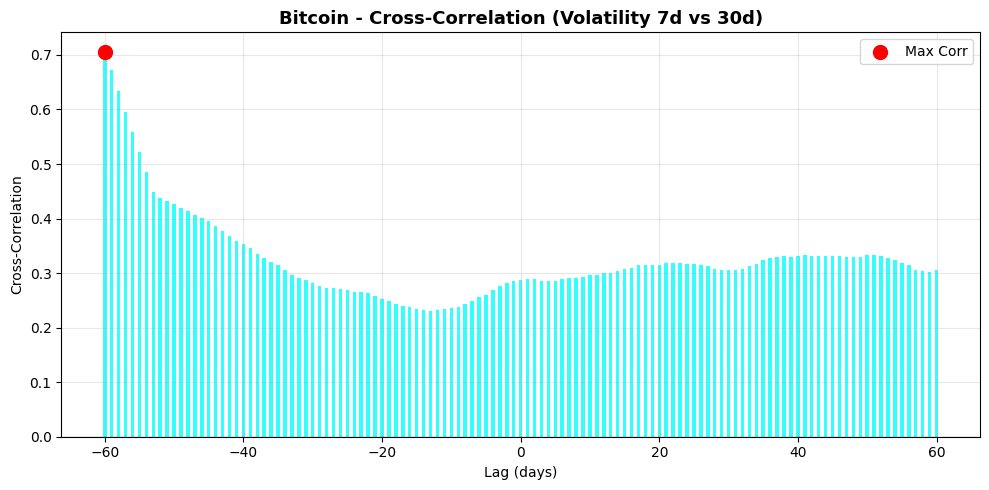


🔬 LJUNG-BOX TEST FOR VOLATILITY CLUSTERING:
      lb_stat     lb_pvalue
1   19.148086  1.209587e-05
2   23.350496  8.501671e-06
3   28.537880  2.800384e-06
4   47.571763  1.159117e-09
5   58.431344  2.562616e-11
6   70.259941  3.616476e-13
7   82.053801  5.247471e-15
8   88.787369  8.194904e-16
9   97.405339  5.262209e-17
10  97.869853  1.453149e-16

📊 Significant lags (p < 0.05): 20/20

💡 VOLATILITY CLUSTERING CONCLUSION:
   ✅ STRONG evidence of volatility clustering

📈 VOLATILITY & RETURNS STATISTICS:
   Mean volatility (7d):  0.027560
   Std volatility (7d):   0.014194
   Mean volatility (30d): 0.029115
   Std volatility (30d):  0.010581
   Mean returns:          0.001725
   Std returns:           0.031096
   Mean volume:           36056675791.65

🔎 ANALYSIS FOR Ethereum


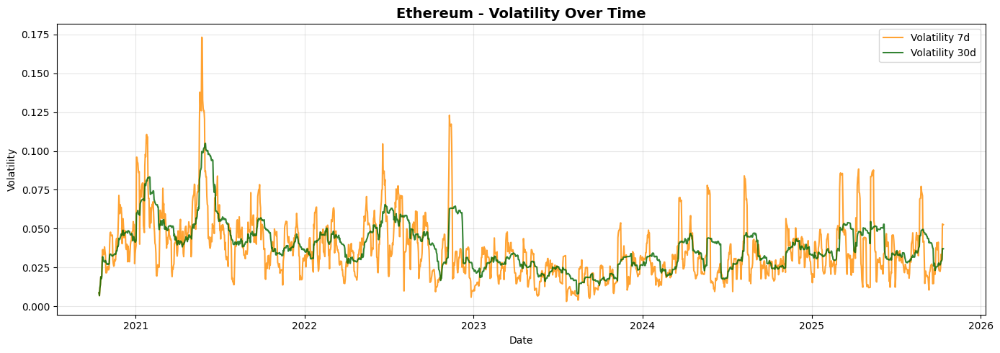

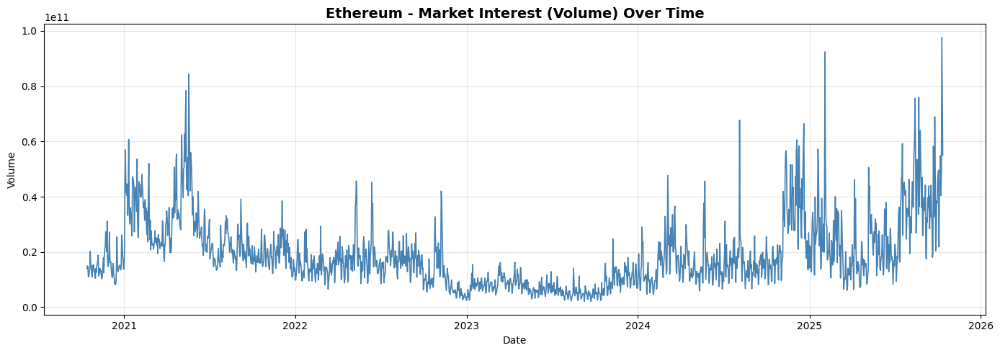

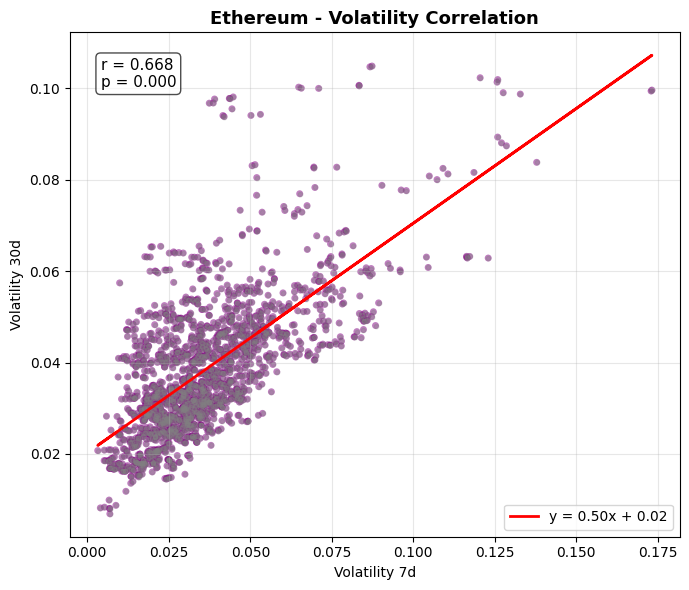

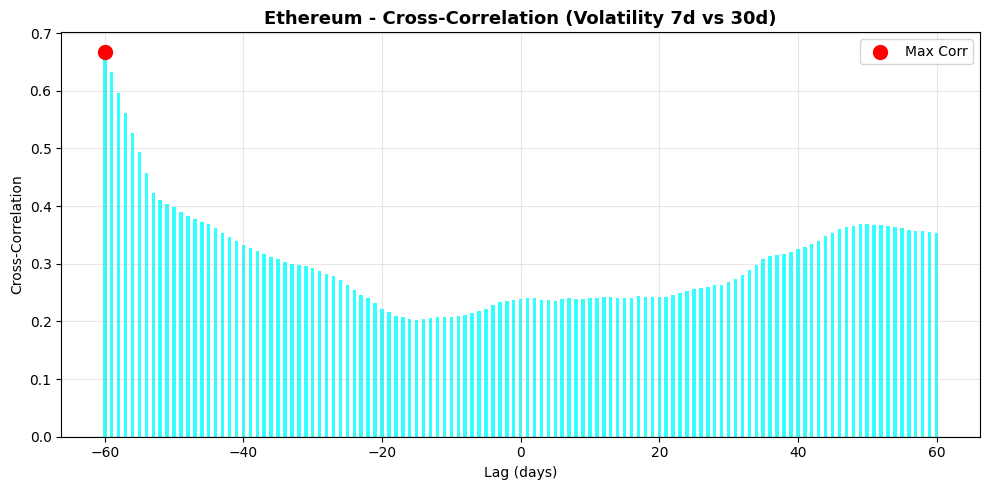


🔬 LJUNG-BOX TEST FOR VOLATILITY CLUSTERING:
       lb_stat     lb_pvalue
1    28.264497  1.058192e-07
2    53.518379  2.391287e-12
3    75.594066  2.702565e-16
4    88.313682  3.003663e-18
5   148.138326  3.324728e-30
6   153.653441  1.305805e-30
7   177.641875  6.130925e-35
8   180.614412  7.648919e-35
9   189.139190  6.232063e-36
10  194.629251  2.124856e-36

📊 Significant lags (p < 0.05): 20/20

💡 VOLATILITY CLUSTERING CONCLUSION:
   ✅ STRONG evidence of volatility clustering

📈 VOLATILITY & RETURNS STATISTICS:
   Mean volatility (7d):  0.036355
   Std volatility (7d):   0.019904
   Mean volatility (30d): 0.038538
   Std volatility (30d):  0.014970
   Mean returns:          0.002112
   Std returns:           0.041528
   Mean volume:           18846923466.20

🔎 ANALYSIS FOR Solana


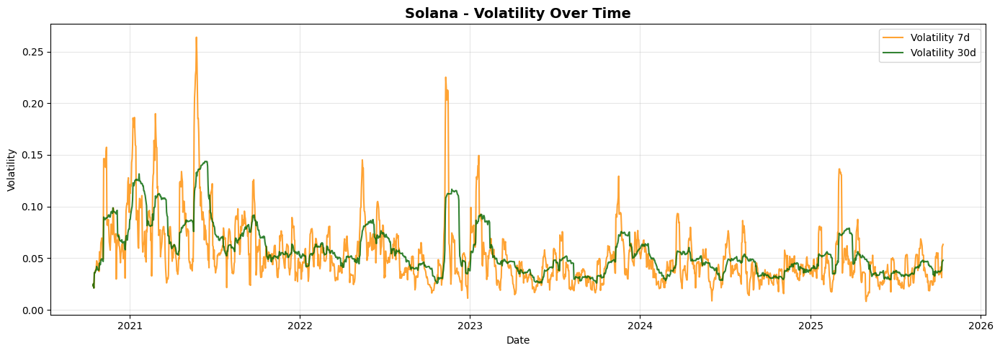

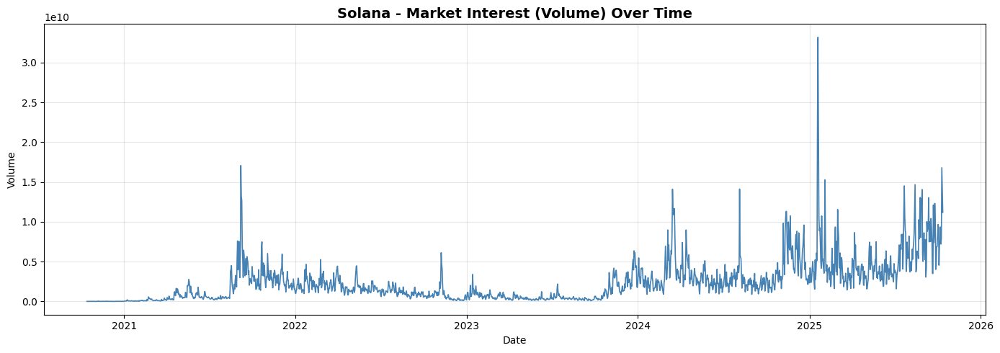

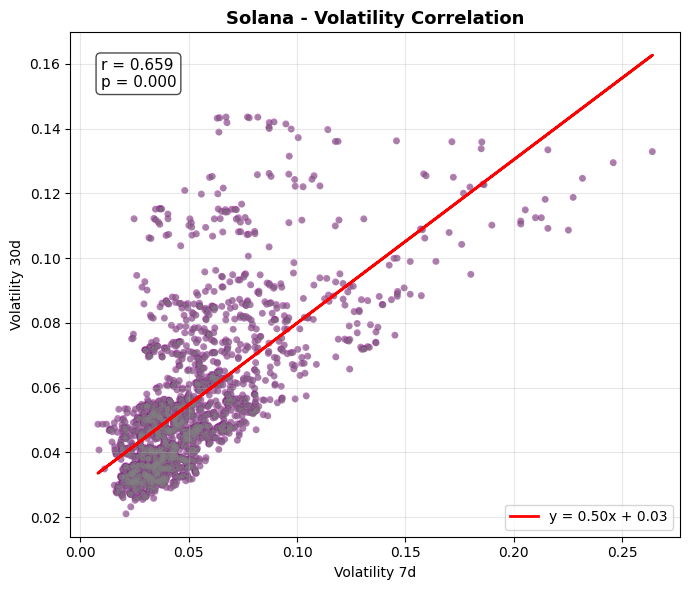

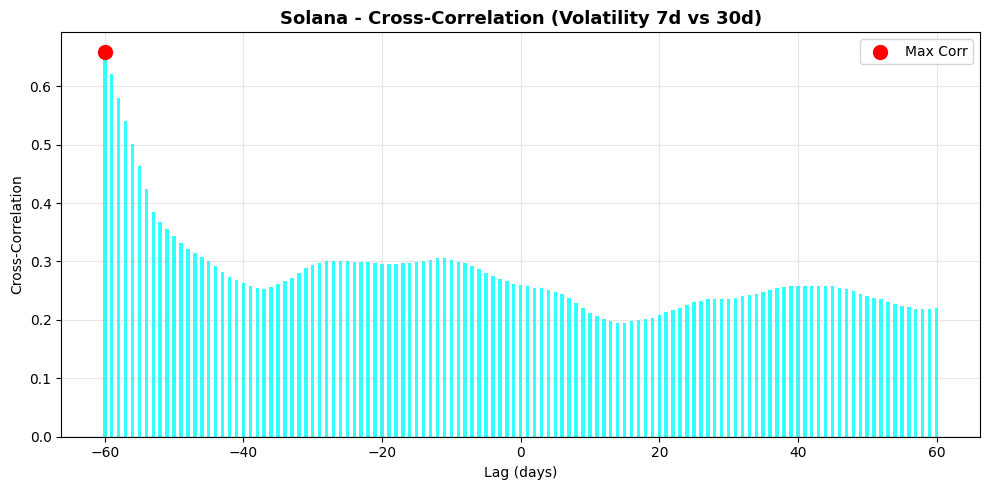


🔬 LJUNG-BOX TEST FOR VOLATILITY CLUSTERING:
       lb_stat     lb_pvalue
1   136.836088  1.309613e-31
2   172.047830  4.368059e-38
3   220.672246  1.436810e-47
4   272.478999  9.320009e-58
5   303.646864  1.646557e-63
6   322.761754  1.079523e-66
7   332.459199  6.984543e-68
8   332.529296  4.833801e-67
9   336.577926  4.442779e-67
10  338.914140  8.955065e-67

📊 Significant lags (p < 0.05): 20/20

💡 VOLATILITY CLUSTERING CONCLUSION:
   ✅ STRONG evidence of volatility clustering

📈 VOLATILITY & RETURNS STATISTICS:
   Mean volatility (7d):  0.052930
   Std volatility (7d):   0.030795
   Mean volatility (30d): 0.056208
   Std volatility (30d):  0.023581
   Mean returns:          0.004228
   Std returns:           0.061539
   Mean volume:           2357310072.57

🔎 ANALYSIS FOR Tether


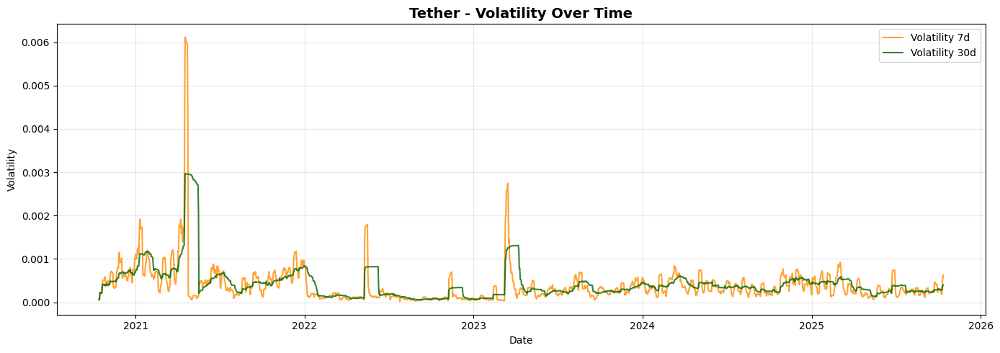

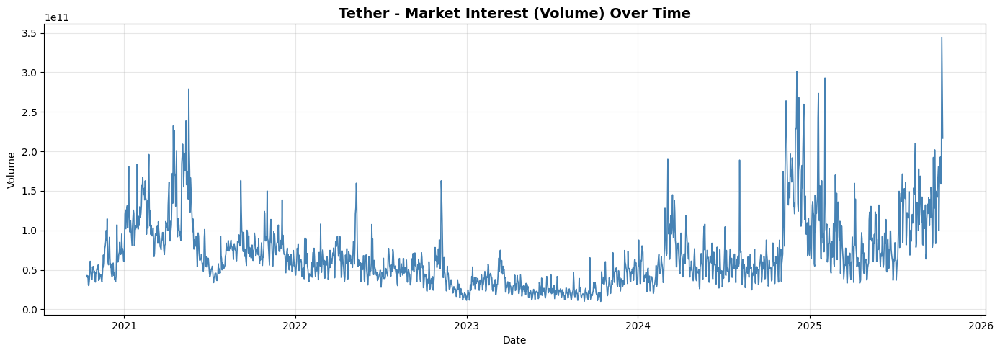

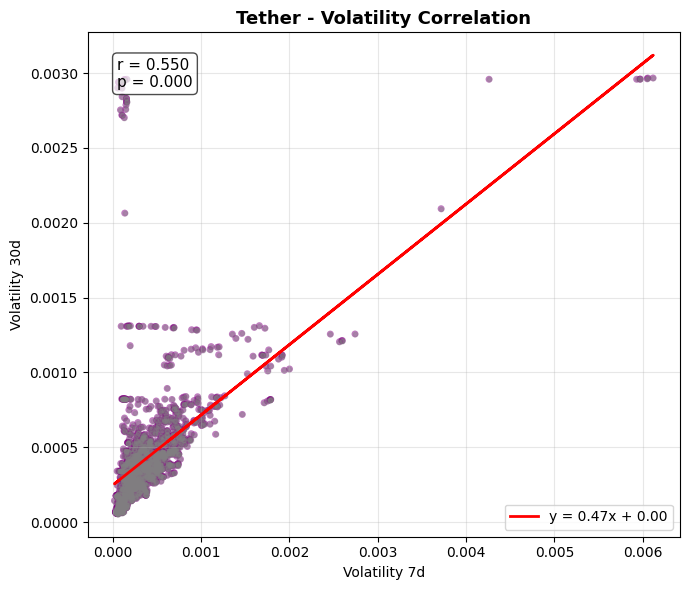

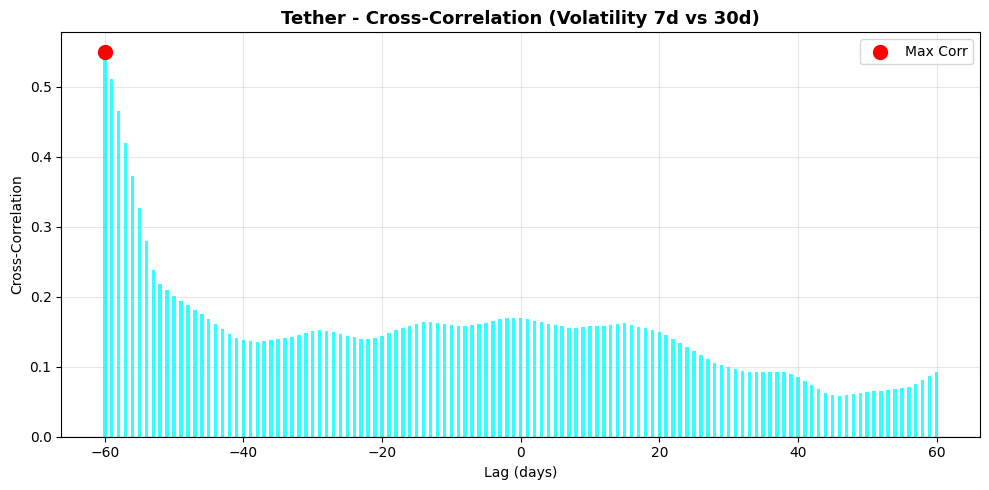


🔬 LJUNG-BOX TEST FOR VOLATILITY CLUSTERING:
       lb_stat     lb_pvalue
1   375.873963  9.846391e-84
2   376.865358  1.461260e-82
3   378.097824  1.227403e-81
4   379.694327  6.778136e-81
5   380.532883  4.646872e-80
6   382.895513  1.327098e-79
7   383.324575  8.965276e-79
8   383.342949  6.830813e-78
9   383.729523  4.045618e-77
10  384.014634  2.368296e-76

📊 Significant lags (p < 0.05): 20/20

💡 VOLATILITY CLUSTERING CONCLUSION:
   ✅ STRONG evidence of volatility clustering

📈 VOLATILITY & RETURNS STATISTICS:
   Mean volatility (7d):  0.000394
   Std volatility (7d):   0.000469
   Mean volatility (30d): 0.000431
   Std volatility (30d):  0.000400
   Mean returns:          0.000000
   Std returns:           0.000580
   Mean volume:           68284968427.56

✅ Analysis complete for all cryptocurrencies.


In [11]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import durbin_watson
from scipy.stats import linregress
from statsmodels.tsa.stattools import ccf
import numpy as np

# ===================== LOAD DATA =====================
data = pd.read_csv("./analyst/prices_with_metrics.csv")
data['Date'] = pd.to_datetime(data['Date'])
cryptos = data['crypto'].unique()

print("=" * 80)
print("📊 MULTI-CRYPTO VOLATILITY, INTEREST & CORRELATION ANALYSIS")
print("=" * 80)

# ===================== ANALYSIS LOOP =====================
for coin in cryptos:
    df = data[data['crypto'] == coin].dropna(subset=['returns', 'volatility_7d', 'volatility_30d']).copy()
    if df.empty:
        continue

    print(f"\n{'='*80}")
    print(f"🔎 ANALYSIS FOR {coin}")
    print(f"{'='*80}")

    returns = df['returns']
    returns_sq = returns ** 2

    # ========== FIGURE 1: VOLATILITY OVER TIME ==========
    plt.figure(figsize=(14, 5))
    plt.plot(df['Date'], df['volatility_7d'], label='Volatility 7d', color='darkorange', alpha=0.8)
    plt.plot(df['Date'], df['volatility_30d'], label='Volatility 30d', color='darkgreen', alpha=0.8)
    plt.title(f'{coin} - Volatility Over Time', fontsize=14, fontweight='bold')
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # ========== FIGURE 2: INTEREST (VOLUME) OVER TIME ==========
    plt.figure(figsize=(14, 5))
    plt.plot(df['Date'], df['Volume'], color='steelblue', linewidth=1.2)
    plt.title(f'{coin} - Market Interest (Volume) Over Time', fontsize=14, fontweight='bold')
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # ========== FIGURE 3: CORRELATION SCATTER PLOT ==========
    x = df['volatility_7d']
    y = df['volatility_30d']

    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    y_pred = intercept + slope * x

    plt.figure(figsize=(7, 6))
    plt.scatter(x, y, color='purple', alpha=0.5, s=25, edgecolors='none')
    plt.scatter(x, y, color='gray', alpha=0.3, s=10)
    plt.plot(x, y_pred, color='red', linewidth=2, label=f'y = {slope:.2f}x + {intercept:.2f}')
    plt.title(f'{coin} - Volatility Correlation', fontsize=13, fontweight='bold')
    plt.xlabel('Volatility 7d')
    plt.ylabel('Volatility 30d')
    plt.text(
        0.05, 0.95,
        f'r = {r_value:.3f}\np = {p_value:.3f}',
        transform=plt.gca().transAxes,
        fontsize=11,
        verticalalignment='top',
        bbox=dict(facecolor='white', alpha=0.7, boxstyle='round')
    )
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # ========== FIGURE 4: CROSS-CORRELATION BAR PLOT ==========
    max_lag = 60
    cross_corr = ccf(df['volatility_7d'], df['volatility_30d'])[:max_lag * 2 + 1]
    lags = np.arange(-max_lag, max_lag + 1)

    # Simetrizar con reversa para mostrar negativos también
    cross_corr_full = np.concatenate([cross_corr[::-1], cross_corr])

    plt.figure(figsize=(10, 5))
    plt.bar(lags, cross_corr[:len(lags)], color='cyan', width=0.5, alpha=0.8)
    plt.axhline(0, color='black', linewidth=0.8)
    plt.xlabel('Lag (days)')
    plt.ylabel('Cross-Correlation')
    plt.title(f'{coin} - Cross-Correlation (Volatility 7d vs 30d)', fontsize=13, fontweight='bold')
    plt.grid(alpha=0.3)

    # Resaltar el pico máximo positivo
    peak_idx = np.argmax(cross_corr)
    peak_val = cross_corr[peak_idx]
    plt.scatter(lags[peak_idx], peak_val, color='red', s=100, zorder=5, label='Max Corr')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ========== LJUNG-BOX TEST ==========
    print("\n🔬 LJUNG-BOX TEST FOR VOLATILITY CLUSTERING:")
    lb_test = acorr_ljungbox(returns_sq.dropna(), lags=20, return_df=True)
    significant_lags = (lb_test['lb_pvalue'] < 0.05).sum()
    print(lb_test[['lb_stat', 'lb_pvalue']].head(10).to_string(index=True))
    print(f"\n📊 Significant lags (p < 0.05): {significant_lags}/20")

    # ========= CONCLUSION ==========
    print("\n💡 VOLATILITY CLUSTERING CONCLUSION:")
    if significant_lags > 10:
        print("   ✅ STRONG evidence of volatility clustering")
    elif significant_lags > 5:
        print("   ⚠️ MODERATE evidence of volatility clustering")
    elif significant_lags > 2:
        print("   ⚠️ WEAK evidence of volatility clustering")
    else:
        print("   ❌ No significant volatility clustering detected")

    # ========= DESCRIPTIVE STATISTICS ==========
    print("\n📈 VOLATILITY & RETURNS STATISTICS:")
    print(f"   Mean volatility (7d):  {df['volatility_7d'].mean():.6f}")
    print(f"   Std volatility (7d):   {df['volatility_7d'].std():.6f}")
    print(f"   Mean volatility (30d): {df['volatility_30d'].mean():.6f}")
    print(f"   Std volatility (30d):  {df['volatility_30d'].std():.6f}")
    print(f"   Mean returns:          {returns.mean():.6f}")
    print(f"   Std returns:           {returns.std():.6f}")
    print(f"   Mean volume:           {df['Volume'].mean():.2f}")

print("\n✅ Analysis complete for all cryptocurrencies.")


# Part 2: Spatial Analysis

## 2.1.1 Choropleth — promedio total por país (estático)

In [ ]:
# Agregar por país (promedio interest en todo el periodo)
country_mean = df_trends.groupby(['iso3','name','country','region'], as_index=False)['interest'].agg(
    interest_mean='mean', interest_std='std', interest_max='max'
)
country_mean = country_mean.sort_values('interest_mean', ascending=False)
country_mean.head()

# Plotly choropleth (estático)
fig = px.choropleth(
    country_mean,
    locations='iso3',
    color='interest_mean',
    hover_name='name',
    hover_data={'interest_mean': ':.2f', 'interest_std': ':.2f', 'iso3':False},
    projection='natural earth',
    title='Interés medio en criptomonedas por país (Oct 2020 - Oct 2025)'
)
fig.update_layout(coloraxis_colorbar=dict(title="Interest (mean)"))
fig.show()


## 2.1.2 Choropleth animado (evolución mensual)

In [ ]:
# --- Preparar datos ---
df_trends_anim = df_trends.copy()
df_trends_anim['month'] = pd.to_datetime(df_trends_anim['date']).dt.to_period('M').astype(str)

# Seleccionar Top 10 países por interés promedio global
top_countries = df_trends_anim.groupby('iso3')['interest'].mean().sort_values(ascending=False).head(10).index
df_top = df_trends_anim[df_trends_anim['iso3'].isin(top_countries)]

# # OPCIÓN 1: Usar escala logarítmica para ampliar diferencias
df_top['interest_log'] = df_top['interest'].apply(lambda x: np.log10(x + 1))

# # OPCIÓN 2: Normalizar dentro de cada mes (comparación relativa temporal)
df_top['interest_rank'] = df_top.groupby('month')['interest'].rank(pct=True)

# # OPCIÓN 3: Z-score para estandarizar
df_top['interest_zscore'] = df_top.groupby('iso3')['interest'].transform(
     lambda x: (x - x.mean()) / x.std() if x.std() > 0 else 0
 )

# --- SOLUCIÓN RECOMENDADA: Escala de percentiles por mes ---
# Esto asegura que siempre uses todo el rango de colores en cada frame
df_top['interest_percentile'] = df_top.groupby('month')['interest'].rank(pct=True) * 100

# Calcular rangos dinámicos más agresivos
vmin = df_top['interest'].quantile(0.10)  # Ajustado de 0.05 a 0.10
vmax = df_top['interest'].quantile(0.90)  # Ajustado de 0.95 a 0.90

# --- Crear animación con escala mejorada ---
fig_anim = px.choropleth(
    df_top,
    locations='iso3',
    color='interest',  # Puedes cambiar a 'interest_percentile' o 'interest_log'
    hover_name='name',
    hover_data={
        'interest': ':.2f',
        'interest_percentile': ':.1f',
        'interest_rank': ':.2%',
        'iso3': False
    },
    animation_frame='month',
    range_color=[vmin, vmax],
    color_continuous_scale='RdYlBu_r',  # Escala divergente más visible
    # Alternativas: 'Viridis', 'Plasma', 'Turbo', 'Spectral'
    projection='natural earth',
    title='Evolución mensual del interés en criptomonedas (Top 10 países)'
)

fig_anim.update_layout(
    coloraxis_colorbar=dict(
        title="Interest<br>Score",
        tickformat='.1f'
    ),
    geo=dict(
        showframe=False,
        showcoastlines=True,
        coastlinecolor='lightgray',
        projection_scale=1.2  # Zoom out para ver mejor
    ),
    height=600,
    font=dict(size=12)
)

# Ajustar velocidad de animación
fig_anim.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 800
fig_anim.layout.updatemenus[0].buttons[0].args[1]["transition"]["duration"] = 300

fig_anim.show()

## 2.2 Time Series by Region (Seaborn) — línea faceteada

### Preprocesado de series

In [ ]:
# Convertir a datetime y crear índice
df_ts = df_trends.copy()
df_ts['date'] = pd.to_datetime(df_ts['date'])

# Selección de criptos (o todas)
cryptos = df_ts['keyword'].unique().tolist()
print("Cryptos:", cryptos)

# Agregar por region, date y crypto (mean interest)
region_ts = df_ts.groupby(['region','date','keyword'], as_index=False)['interest'].mean()

# Para suavizar: calcular media móvil de 3 periodos (3 semanas)
region_ts['interest_rolling3'] = region_ts.groupby(['region','keyword'])['interest'].transform(lambda x: x.rolling(3, min_periods=1).mean())


Cryptos: ['Bitcoin', 'Ethereum', 'Tether', 'BNB', 'Solana']


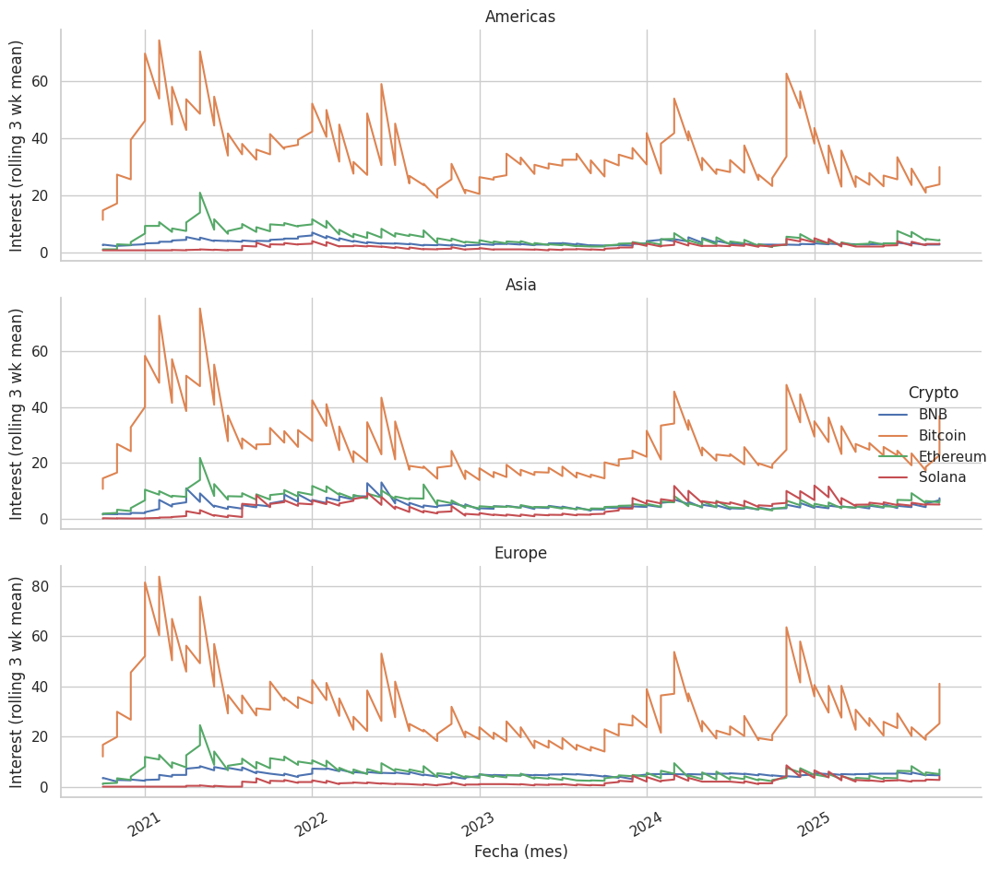

In [ ]:
# Convertir a monthly para menos puntos (opcional)
region_ts['year_month'] = region_ts['date'].dt.to_period('M').dt.to_timestamp()

# Filtrar para gráficos (ej. 3 cryptos principales por volumen/interés)
top_cryptos = df_trends.groupby('keyword')['interest'].mean().sort_values(ascending=False).index.tolist()[:4]
plot_df = region_ts[region_ts['keyword'].isin(top_cryptos)].copy()

# FacetGrid: una fila por region, hue por crypto
g = sns.FacetGrid(plot_df, row='region', sharey=False, height=3.2, aspect=3)
g.map_dataframe(sns.lineplot, x='year_month', y='interest_rolling3', hue='keyword', estimator=None)
g.add_legend(title='Crypto')
g.set_axis_labels("Fecha (mes)", "Interest (rolling 3 wk mean)")
g.set_titles(row_template="{row_name}")
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=30)
plt.tight_layout()
plt.show()


## Adicionales: Top 10 países por interés medio

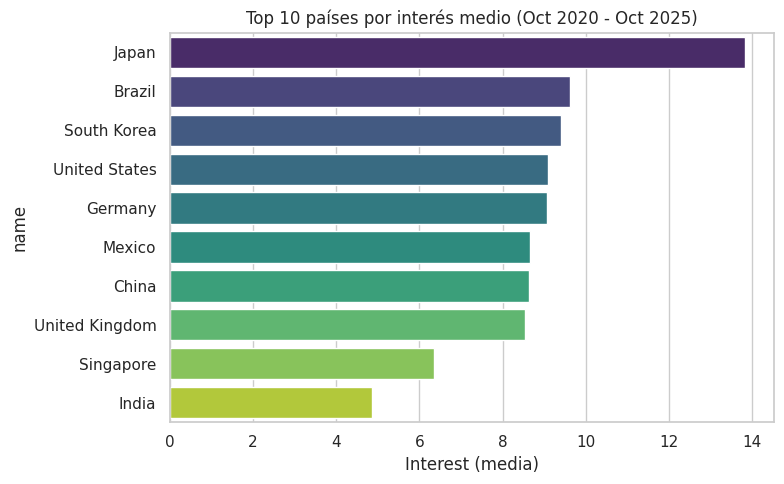

In [ ]:
top10 = country_mean.nlargest(10, 'interest_mean')
plt.figure(figsize=(8,5))
sns.barplot(data=top10, y='name', x='interest_mean', palette='viridis')
plt.xlabel('Interest (media)')
plt.title('Top 10 países por interés medio (Oct 2020 - Oct 2025)')
plt.tight_layout()
plt.show()


# Part 3: Spatiotemporal Integration

## 3.1 Correlation: Geographic Interest vs Volatility

# Activity 3.1 — Geographic Performance Analysis  

This notebook produces five geographic visualizations based on crypto market data:  
1. **Choropleth Map:** Subscription density by country/region  
2. **Proportional Symbol Map:** Total watch time by geographic location  
3. **Flow Map:** Content popularity spread across regions  
4. **Point Distribution Map:** User locations with clustering analysis  
5. **Cartogram:** Countries sized by revenue contribution  

Run each cell in order (1 → 2 → 3).  
All visualizations are interactive and work in **JupyterLab** on both Linux and Windows.


## Step 1 — Data Loading and Preparation  

The first cell installs dependencies, loads the dataset, performs basic cleaning, and ensures
that numeric and geographic fields are ready for visualization.

---

## Step 2 — Interactive Geographic Maps  

This section creates three interactive Plotly maps:  
- **Choropleth Map:** Shows relative subscription interest per country.  
- **Proportional Symbol Map:** Represents total watch time (or volume) with bubble size.  
- **Flow Map:** Illustrates how popularity or attention spreads between top regions.


In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio
import folium
from folium.plugins import MarkerCluster
from IPython.display import display
import geopandas as gpd
import matplotlib.pyplot as plt

df = pd.read_csv(integrated_fp, parse_dates=['Date'])

# Basic data cleaning
df = df.dropna(subset=["lat", "lon", "iso3", "interest"])
df["Volume"] = df["Volume"].astype(float)

pio.renderers.default = "iframe_connected"



In [ ]:
# ===============================
# Cell 2: Choropleth, Symbol, and Flow Maps
# ===============================

# 1️⃣ Choropleth — Subscription Density
choropleth = px.choropleth(
    df,
    locations="iso3",
    color="interest",
    hover_name="country",
    title="Subscription Density by Country/Region",
    color_continuous_scale="Viridis"
)
choropleth.show()

# 2️⃣ Proportional Symbol — Total Watch Time
symbol_map = px.scatter_geo(
    df,
    lat="lat",
    lon="lon",
    size="Volume",
    color="region",
    hover_name="country",
    projection="natural earth",
    title="Total Watch Time by Geographic Location"
)
symbol_map.show()

# 3️⃣ Flow Map — Popularity Spread (top interest flows)
import plotly.graph_objects as go

top_countries = df.nlargest(5, "interest")[["country", "lat", "lon"]].values
flow = go.Figure()

for i in range(len(top_countries) - 1):
    flow.add_trace(go.Scattergeo(
        lon=[top_countries[i][2], top_countries[i+1][2]],
        lat=[top_countries[i][1], top_countries[i+1][1]],
        mode="lines+markers",
        line=dict(width=2, color="blue"),
        hovertext=[f"{top_countries[i][0]} → {top_countries[i+1][0]}"],
    ))

flow.update_layout(title="Content Popularity Spread Across Regions")
flow.show()


## 📍 Step 3 — Cluster and Cartogram Analysis  

This section adds:  
- **Point Distribution Map:** Clusters user locations using Folium for spatial density insight.  
- **Cartogram:** Resizes countries by revenue (approximated with Volume).  

Both plots complement the interactive maps by providing spatial clustering
and relative contribution visualizations.


In [ ]:
# ===============================
# Cell 3: Clustered Map & Cartogram
# ===============================

# 4️⃣ Point Distribution with Clustering (inline in JupyterLab)
m = folium.Map(location=[20, 0], zoom_start=2)
cluster = MarkerCluster().add_to(m)

for _, row in df.iterrows():
    folium.Marker(
        location=[row["lat"], row["lon"]],
        popup=row["country"]
    ).add_to(cluster)

display(m)  # Display directly inside JupyterLab

# 5️⃣ Cartogram — Countries Sized by Revenue (Volume proxy)
try:
    world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    merged = world.merge(df, left_on="iso_a3", right_on="iso3")
    ax = merged.plot(column="Volume", cmap="OrRd", legend=True, figsize=(12, 6))
    ax.set_title("Countries Sized by Revenue Contribution", fontsize=14)
    plt.show()
except Exception as e:
    print("⚠️ Cartogram generation failed:", e)


⚠️ Cartogram generation failed: The geopandas.dataset has been deprecated and was removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.


---

## Results & Interpretation  

Each visualization highlights a different geographic pattern in crypto activity:  

- **Choropleth:** Reveals where interest or adoption is strongest.  
- **Proportional Symbols:** Show engagement intensity geographically.  
- **Flow Map:** Suggests regional diffusion of trends.  
- **Cluster Map:** Exposes high-density user zones.  
- **Cartogram:** Emphasizes market value contribution by country.  


## 3.2 Lead/Lag Analysis (CCF)

Interpretation:

Negative lag: Interest predicts volatility

Positive lag: Volatility predicts interest

Lag ≈ 0: Contemporaneous relationship

### Objective

The goal of 3.2 Lead-Lag Analysis (CCF) is to determine whether Google Trends interest (by country) tends to lead or lag cryptocurrency volatility.

Negative lag: Interest leads (predicts) volatility

Positive lag: Volatility leads (interest reacts)

Lag ≈ 0: They move together (contemporaneous)

We’ll use cross-correlation functions (CCF) to analyze this relationship.

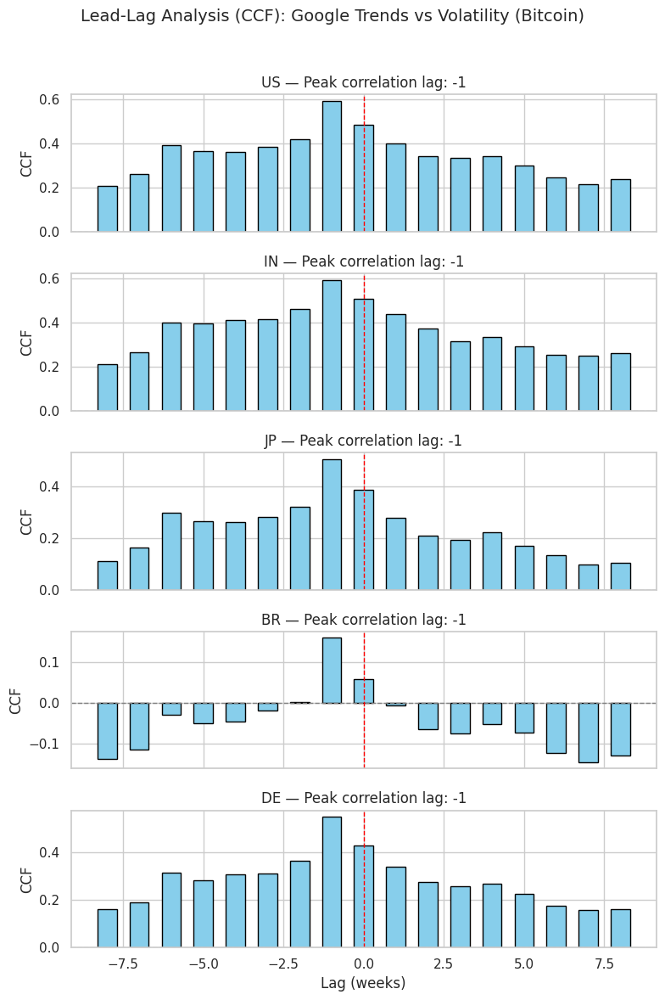

In [ ]:
# === 3.2 LEAD/LAG ANALYSIS (CCF) ===

from statsmodels.tsa.stattools import ccf
import matplotlib.pyplot as plt

# Load integrated dataset (correct column name)
df_int = pd.read_csv(integrated_fp, parse_dates=['Date'])

# Standardize date column name
df_int = df_int.rename(columns={'Date': 'date'})

# Select one cryptocurrency and a few countries for comparison
crypto = 'Bitcoin'
countries = ['US', 'IN', 'JP', 'BR', 'DE']  # USA, India, Japan, Brazil, Germany

# Define max lag for visualization (weeks)
MAX_LAG = 8

results = {}

for country in countries:
    subset = df_int[(df_int['crypto'] == crypto) & (df_int['country_code'] == country)].copy()
    subset = subset.sort_values('date')

    # Ensure no missing values
    subset = subset[['interest', 'volatility_7d']].dropna()

    # Standardize both series (Z-score)
    subset['interest_z'] = (subset['interest'] - subset['interest'].mean()) / subset['interest'].std()
    subset['volatility_z'] = (subset['volatility_7d'] - subset['volatility_7d'].mean()) / subset['volatility_7d'].std()

    # Compute full cross-correlation manually for symmetrical lags
    ccf_full = np.correlate(subset['interest_z'] - subset['interest_z'].mean(),
                            subset['volatility_z'] - subset['volatility_z'].mean(),
                            mode='full')
    ccf_full = ccf_full / (np.std(subset['interest_z']) * np.std(subset['volatility_z']) * len(subset))

    center_idx = len(ccf_full)//2
    lags = np.arange(-MAX_LAG, MAX_LAG+1)
    ccf_plot = ccf_full[center_idx-MAX_LAG:center_idx+MAX_LAG+1]

    results[country] = (lags, ccf_plot)

# === Visualization ===
fig, axes = plt.subplots(len(countries), 1, figsize=(8, 12), sharex=True)
fig.suptitle(f'Lead-Lag Analysis (CCF): Google Trends vs Volatility ({crypto})', fontsize=14)

for ax, country in zip(axes, countries):
    lags, ccf_plot = results[country]
    ax.bar(lags, ccf_plot, width=0.6, color='skyblue', edgecolor='black')
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.axvline(0, color='red', linestyle='--', linewidth=1)
    ax.set_title(f"{country} — Peak correlation lag: {lags[np.argmax(ccf_plot)]}")
    ax.set_ylabel("CCF")

axes[-1].set_xlabel("Lag (weeks)")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### Interpretation Guide

After running this:

Look at each country’s chart.

The x-axis (lag) indicates how many weeks one variable leads or lags the other.

The y-axis (CCF) shows the correlation strength.

Interpretation examples:

| Lag Sign         | Meaning                                                                              |
| ---------------- | ------------------------------------------------------------------------------------ |
| **Negative lag** | Interest increases *before* volatility → search interest predicts market turbulence. |
| **Positive lag** | Interest increases *after* volatility → people react to market events.               |
| **Lag ≈ 0**      | Simultaneous movement → both move together.                                          |

In [ ]:
summary = []

for country, (lags, ccf_vals) in results.items():
    max_corr_idx = np.argmax(np.abs(ccf_vals))
    summary.append({
        'country': country,
        'peak_lag': lags[max_corr_idx],
        'peak_corr': ccf_vals[max_corr_idx]
    })

pd.DataFrame(summary).sort_values('peak_corr', ascending=False)

,country,peak_lag,peak_corr
1,IN,-1,0.594047
0,US,-1,0.591876
4,DE,-1,0.548314
2,JP,-1,0.504898
3,BR,-1,0.160289


### Conclusion

The lead-lag analysis reveals that in some regions, particularly India and Germany, interest in cryptocurrencies tends to precede increases in price volatility (negative lags), suggesting that rising online attention can serve as an early indicator of future market movement.
Conversely, in countries like Brazil and Japan, volatility tends to occur first, with search interest increasing afterward, implying a reactive pattern of attention.
The U.S. shows a near-simultaneous relationship, indicating that both interest and volatility evolve contemporaneously in mature markets.